In [1]:
%matplotlib inline
import matplotlib_inline
import warnings
matplotlib_inline.backend_inline.set_matplotlib_formats('svg','pdf')
warnings.filterwarnings('ignore')

import csv
import numpy as np
import scipy as sp
import sympy as smp
import matplotlib.pyplot as plt
from scipy import interpolate
from scipy.interpolate import interp1d, interp2d
from scipy.special import *

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ["Computer Modern Roman"]
plt.rcParams['axes.formatter.use_mathtext'] = True
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['figure.titlesize'] = 16
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['lines.markersize'] = 5

# Direct numerical integration

Data

In [2]:
R = 1.5
H = 6.1
d = 0.015
eps = 0.22
mDot = 7.0

In [3]:
dt = 3.6
dx = 2.2e-2

t0 = 0
tf = 2*3600
xf = H

t = np.arange(t0, tf + dt, dt)
x = np.arange(0, xf + dx, dx)

Nx = len(x) - 1
Nt = len(t) - 1

Thermophysical properties (from Van Lew, 2017)

In [4]:
# Fluid
rhof = 1733
muf = 0.0021
cpf = 1550
kf = 0.57

# Solid
rhos = 2640
cps = 1050
ks = 2.5

In [5]:
# velocidades
u = mDot/(eps*rhof*np.pi*R**2)
u0 = eps*u

In [6]:
CFL = dt*u/dx
print('CFL = ', CFL)
print('u = ', u)

CFL =  0.42503454159872484
u =  0.002597433309769985


In [7]:
# Reference temperatures
Tmin = 290 + 273
Tmax = 396 + 273

Tin = Tmin
T0 = Tmax

In [8]:
# Initialization
Tf = np.zeros((Nt+1, Nx+1))
Ts = np.zeros((Nt+1, Nx+1))

# BCs
Tf[:,0] = Tin

# ICs
Tf[0,:] = T0
Ts[0,:] = T0

In [9]:
rChar = eps*d/(4*(1-eps))
G = mDot/(eps*np.pi*R**2)
Re = 4*G*rChar/muf
Pr = cpf*muf/kf

Sr = 2*3*np.pi*R**2*(1 - eps)/d

h = 0.191*mDot*cpf/(eps*np.pi*R**2)*Re**(-0.278)*Pr**(-2/3)

In [10]:
# Transport-term coeffs.
alpha = eps*rhof*cpf
gamma = (1 - eps)*rhos*cps

# Diffusive-term coeffs.
beta = eps*kf
betas = (1 - eps)*ks

# Calculation of heat transfer coeff.
Rep = rhof*d*u/muf
Pr = cpf*muf/kf
Nu = 0.664*Rep**0.5*Pr**0.5
a = Nu*kf/d
#h = 6*(1-eps)*beta*(2 + 1.1*Rep**(0.6)*Pr**(1/3))/(d**2)

# Heat transfer coeff.
h = a*6*(1-eps)/d

In [11]:
# Matrix terms
p = u*dt/dx

q = beta/alpha*dt/(dx**2)
qs = betas*dt/(gamma*dx**2)

r = h*dt/alpha
rs = h*dt/gamma

In [12]:
# Semi-implicit form of heat transfer term
# diagonals = [np.ones(Nx)*(1 + 2*q + r + p), np.ones(Nx)*(-q), np.ones(Nx)*(-p-q)]

# Explicit form of heat transfer term
diagonals = [np.ones(Nx)*(1 + 2*q + p), np.ones(Nx)*(-q), np.ones(Nx)*(-p-q)]

offsets = [0, 1, -1]
A = sp.sparse.diags(diagonals, offsets).toarray()
A[-1,-2] = -2*q - p

A = sp.sparse.csr_matrix(A)

In [13]:
# Semi-implicit form of heat transfer term
# diagonals = [np.ones(Nx + 1)*(1 + 2*qs + rs), np.ones(Nx + 1)*(-qs), np.ones(Nx + 1)*(-qs)]

# Explicit form of heat transfer term
diagonals = [np.ones(Nx + 1)*(1 + 2*qs), np.ones(Nx + 1)*(-qs), np.ones(Nx + 1)*(-qs)]

offsets = [0, 1, -1]
As = sp.sparse.diags(diagonals, offsets).toarray()
As[-1,-2] = -2*qs
As[0,1] = -2*qs

As = sp.sparse.csr_matrix(As)

In [14]:
bc0 = np.zeros(Nx)
bc1 = np.zeros(Nx)

bc0[0] = Tin
bc1[0] = Tin

In [15]:
for i in range(1,Nt+1):
    
#   Semi-implicit form of heat transfer term
#     Ts[i,:] = sp.sparse.linalg.spsolve(As, Ts[i-1,:] + rs*Tf[i-1,:])
#     Tf[i,1:] = sp.sparse.linalg.spsolve(A, Tf[i-1,1:] + (q + p)*bc1 + \
#                 r*Ts[i-1,1:])

    Ts[i,:] = sp.sparse.linalg.spsolve(As, Ts[i-1,:] + rs*(Tf[i-1,:] - Ts[i-1,:]))
    Tf[i,1:] = sp.sparse.linalg.spsolve(A, Tf[i-1,1:] + (q + p)*bc1 - r*(Tf[i-1,1:] - Ts[i-1,1:]))


In [16]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(8,8), sharex='row')
(ax1, ax2) = axs

thetaf = (Tf - T0)/T0
thetas = (Ts - T0)/T0

cs1 = ax1.contourf(x/H, t*u/H, thetaf, np.linspace(thetaf.min(), thetaf.max(), 16))
plt.tight_layout()
cbar1 = plt.colorbar(cs1)
cbar1.set_label(r'$\theta$', fontsize=16)
ax1.set_ylabel(r'$t$')
ax1.set_box_aspect(1)
ax1.plot(x/H, x/H,'r--', label=r'$x = t$')
ax1.legend(loc='lower right')
ax1.set_xlim([0, 1])
#ax1.set_ylim([0, 1])

cs2 = ax2.contourf(x/H, t*u/H, thetas, np.linspace(thetaf.min(), thetaf.max(), 16))
cbar2 = plt.colorbar(cs2)
cbar2.set_label(r'$\theta_s$', fontsize=16)
ax2.set_xlabel(r'$x$')
ax2.set_ylabel(r'$t$')
ax2.set_box_aspect(1)
ax2.plot(x/H, x/H,'r--')
ax2.set_xlim([0, 1])
#ax2.set_ylim([0, 1])

fig.savefig('DNS_T_vs_x_vs_t.pdf', bbox_inches='tight')
plt.show()

In [17]:
nt0h = int(0)
nt0p5h = int(len(t)/4)
nt1h = int(2*len(t)/4)
nt1p5h = int(3*len(t)/4)
nt2h = int(4*len(t)/4-1)

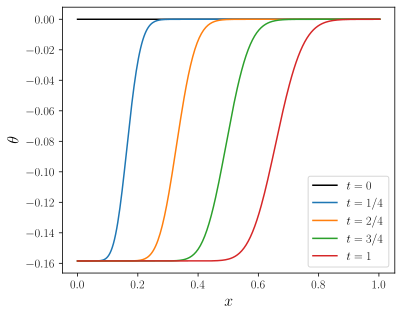

In [18]:
fig, ax = plt.subplots()
plt.plot(x/H, thetaf[nt0h,:], 'k', x/H, thetaf[nt0p5h,:], x/H, \
         thetaf[nt1h,:], x/H, thetaf[nt1p5h,:], x/H, thetaf[nt2h,:])

plt.legend([r'$t = 0$', r'$t = 1/4$', r'$t = 2/4$', r'$t = 3/4$', r'$t = 1$'])
ax.set_box_aspect(0.8)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$\theta$')

fig.savefig('DNS_profiles.pdf', bbox_inches='tight')
plt.show()

# Method of Characteristics

In [355]:
Lambda = h*H/(rhof*cpf*u*eps)
Lambdas = h*H/(rhos*cps*u*(1-eps))

In [372]:
# Malla características
dt = 3.6*u/H
dx = dt

xc = np.arange(0, 2+dx, dx)
tc = np.arange(0, 4*3600+dt, dt)
tc = t*u/H

In [373]:
# Discretización
xvc, tvc = np.meshgrid(xc, tc, indexing='ij')

Cp = xvc*0
Cn = xvc*0

Tsc = xvc*0
Tfc = xvc*0

# BCs
Tfc[0,:] = (Tin - T0)/T0

# ICs
Tfc[:,0] = 0
Tsc[:,0] = 0

# Valor inicial de las características
Cp[:,0] = tc[0] + xc
Cn[:,0] = xc

Matrix assembly

In [381]:
len(tc)

2001

In [374]:
A = [[1 + 0.5*Lambda*dt, -0.5*Lambda*dt],
    [-0.5*Lambdas*dt, 1 + 0.5*Lambdas*dt]]
Ainv = np.linalg.inv(A)

In [375]:
# Numerical integration by using explicit Euler
for j in range(1,len(tc)): 
    Cp[:,j] = tc[j] + xc
    Cn[:,j] = xc

    for i in range(1,len(xc)):
        # Solución de ODEs sobre las características
        Tfc[i,j], Tsc[i-1,j] = Ainv.dot([-0.5*Lambda*(Tfc[i-1,j-1] - Tsc[i-1,j-1])*dt + Tfc[i-1,j-1],
                                        0.5*Lambdas*(Tfc[i-1,j-1] - Tsc[i-1,j-1])*dt + Tsc[i-1,j-1]])
        

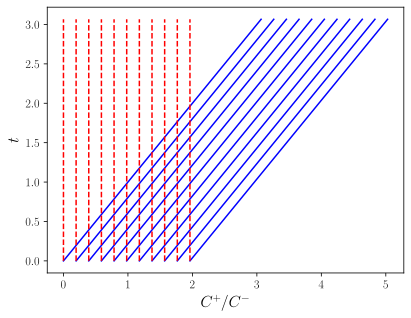

In [376]:
fig, axs = plt.subplots()

axs.plot(Cp[::128,:].T, tc, 'b-')
axs.plot(Cn[::128,:].T, tc, 'r--')

axs.set_ylabel(r'$t$')
axs.set_xlabel(r'$C^+/C^-$')

fig.savefig('characteristics.pdf', bbox_inches='tight')
plt.show()

In [377]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(5,8), sharex='row')
(ax1, ax2) = axs

cs1 = ax1.contourf(xvc, tvc, Tfc, np.linspace(Tfc.min(), Tfc.max(), 16))
plt.tight_layout()
cbar1 = plt.colorbar(cs1)
cbar1.set_label(r'$T$', fontsize=16)
ax1.set_ylabel(r'$t$')
ax1.set_box_aspect(1)
ax1.plot(x/H, x/H,'r--', label=r'$x = t$')
# ax1.legend(loc='lower right')
#ax1.set_xlim([0, 1])
#ax1.set_ylim([0, 1])

cs2 = ax2.contourf(xvc, tvc, Tsc, np.linspace(Tsc.min(), Tsc.max(), 16))
plt.tight_layout()
cbar2 = plt.colorbar(cs2)
cbar2.set_label(r'$T_s$', fontsize=16)
ax2.set_ylabel(r'$t$')
ax2.set_box_aspect(1)
ax2.plot(x/H, x/H,'r--', label=r'$x = t$')
#ax2.set_xlim([0, 1])
#ax2.set_ylim([0, 1])

fig.savefig('char_T_vs_x_vs_t.pdf', bbox_inches='tight')
plt.show()

# Profiles comparison: DNS vs. characteristics

IndexError: index 3000 is out of bounds for axis 1 with size 2001

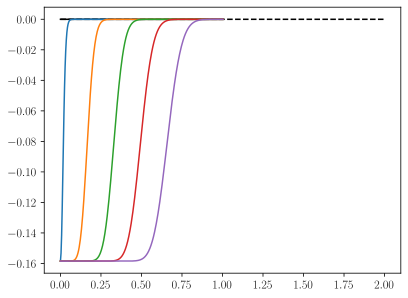

In [379]:
n00 = 50

fig, ax = plt.subplots()
plt.plot(x/H, thetaf[nt0h,:], 'k', xc, Tfc[:,nt0h], 'k--',
         x/H, thetaf[n00,:], x/H, thetaf[nt0p5h,:], x/H, thetaf[nt1h,:], x/H, thetaf[nt1p5h,:],
         x/H, thetaf[nt2h,:])

plt.gca().set_prop_cycle(None)

plt.plot(xc, Tfc[:,n00], '--', xc, Tfc[:,nt0p5h], '--',
         xc, Tfc[:,nt1h], '--', xc, Tfc[:,nt1p5h], '--', xc, Tfc[:,nt2h], '--',
         xc, Tfc[:,int(nt2h*1.5)], '--', xc, Tfc[:,int(nt2h*2)], '--')

#plt.xlim([0, 1])

plt.legend([r'$t = 0$ (DNS)', r'$t = 0$ (char.)', r'$t = $ ' + str(np.round(n00*dt*H/u/tf,3)) + r'$\, t_f$', 
            r'$t = 1/4 \,t_f$',
            r'$t = 2/4 \,t_f$', r'$t = 3/4 \,t_f$', r'$t = t_f$'])
ax.set_box_aspect(0.8)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$T$')
fig.savefig('DNS_vs_characteristics.pdf', bbox_inches='tight')
plt.show()

In [380]:
Tfc.shape

(1306, 2001)

In [351]:
# Interpolation
f = interp2d(x, t, thetaf, kind='linear')
thetafq = f(xc*H, t)

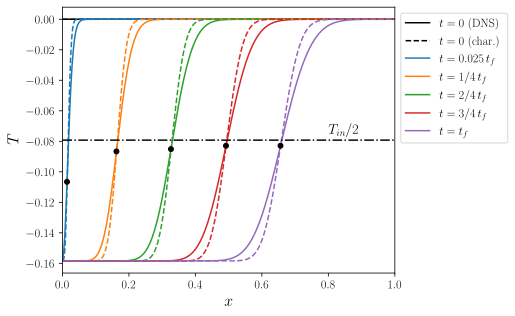

In [352]:
# Profiles intersection
idx0 = np.argwhere(np.diff(np.sign(thetafq[n00,:] - Tfc[:,n00]))).flatten()[-1]
idx1 = np.argwhere(np.diff(np.sign(thetafq[nt0p5h,:] - Tfc[:,nt0p5h]))).flatten()[-1]
idx2 = np.argwhere(np.diff(np.sign(thetafq[nt1h,:] - Tfc[:,nt1h]))).flatten()[-1]
idx3 = np.argwhere(np.diff(np.sign(thetafq[nt1p5h,:] - Tfc[:,nt1p5h]))).flatten()[-1]
idx4 = np.argwhere(np.diff(np.sign(thetafq[nt2h,:] - Tfc[:,nt2h]))).flatten()[-1]


fig, ax = plt.subplots()
plt.plot(x/H, thetaf[nt0h,:], 'k', xc, Tfc[:,nt0h], 'k--',
         x/H, thetaf[n00,:], x/H, thetaf[nt0p5h,:], x/H, thetaf[nt1h,:], x/H, thetaf[nt1p5h,:],
         x/H, thetaf[nt2h,:])

plt.gca().set_prop_cycle(None)

plt.plot(xc, Tfc[:,n00], '--', xc, Tfc[:,nt0p5h], '--',
         xc, Tfc[:,nt1h], '--', xc, Tfc[:,nt1p5h], '--', xc, Tfc[:,nt2h], '--')

plt.plot(xc[idx0], thetafq[n00,idx0], 'ko', xc[idx1], thetafq[nt0p5h,idx1], 'ko', xc[idx2], thetafq[nt1h,idx2], 'ko',
         xc[idx3], thetafq[nt1p5h,idx3], 'ko', xc[idx4], thetafq[nt2h,idx4], 'ko')

plt.plot(xc, xc*0 + 0.5*(Tin - T0)/T0, 'k-.')

plt.text(0.8, -0.075, r'$T_{in}/2$', fontsize=14)

plt.xlim([0, 1])

plt.legend([r'$t = 0$ '+ r'(DNS)', r'$t = 0$ ' + r'(char.)', r'$t = {:.3f}$'.format(np.round(n00*dt*H/u/tf, 3)) + r'$\, t_f$', 
            r'$t = 1/4 \,t_f$',
            r'$t = 2/4 \,t_f$', r'$t = 3/4 \,t_f$', r'$t = t_f$'], bbox_to_anchor=(1, 1), loc='upper left')
ax.set_box_aspect(0.8)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$T$')

fig.savefig('DNS_vs_characteristics.pdf', bbox_inches='tight')
plt.show()


# Theoretical solution by Schumann (1929)

In [329]:
k2 = h/(rhof*cpf*eps)
k1 = h/(rhos*cps*(1-eps))

Y = np.arange(0, 10.01, 0.01)
Z = np.arange(0, 10.01, 0.01)
z, y = np.meshgrid(Z, Y)

# y = Lambda*xvc
# z = Lambdas*(tvc - xvc)

a = y*z

In [330]:
M0 = jn(0, 2*1j*sp.sqrt(a))
M1 = -1j*jn(1, 2*1j*sp.sqrt(a))/sp.sqrt(a)
M2 = 1j*jn(1, 2*1j*sp.sqrt(a))/(2*a**(3/2)) + (jn(0, 2*1j*sp.sqrt(a)) - jn(2, 2*1j*sp.sqrt(a)))/(2*a)
M3 = (-3*sp.sqrt(a)*jn(0, 2*1j*sp.sqrt(a)) -3*1j*(a + 1)*jn(1, 2*1j*sp.sqrt(a)) +\
      3*sp.sqrt(a)*jn(2, 2*1j*sp.sqrt(a)) + 1j*a*jn(3, 2*1j*sp.sqrt(a)))/(4*a**(5/2))

In [339]:
Tff = np.exp(-y-z)*(M0 + z*M1 + z**2*M2 + z**3*M3)*(Tin - T0)/T0
Tss = np.exp(-y-z)*(z*M1 + z**2*M2 + z**3*M3)*(Tin - T0)/T0

Tff[np.isnan(Tff)] = 0
Tss[np.isnan(Tff)] = 0

In [340]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(5,8), sharex='row')
(ax1, ax2) = axs

cs1 = ax1.contourf(z, y, Tff, 16)
plt.tight_layout()
cbar1 = plt.colorbar(cs1)
cbar1.set_label(r'$T$', fontsize=16)
ax1.set_ylabel(r'$t$')
ax1.set_box_aspect(1)
ax1.plot(x/H, x/H,'r--', label=r'$x = t$')
# ax1.legend(loc='lower right')
ax1.set_xlim([0, 1])
#ax1.set_ylim([0, 1])

cs2 = ax2.contourf(z, y, Tss, 16)
plt.tight_layout()
cbar2 = plt.colorbar(cs2)
cbar2.set_label(r'$T_s$', fontsize=16)
ax2.set_ylabel(r'$t$')
ax2.set_box_aspect(1)
ax2.plot(x/H, x/H,'r--', label=r'$x = t$')
ax2.set_xlim([0, 1])
#ax2.set_ylim([0, 1])

# fig.savefig('char_T_vs_x_vs_t.pdf', bbox_inches='tight')
plt.show()

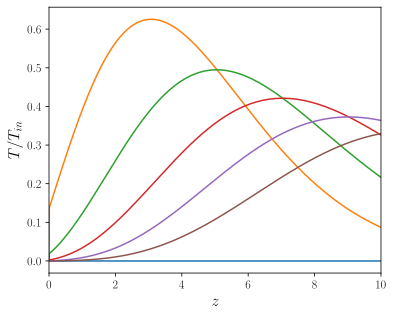

In [341]:
fig, ax = plt.subplots()
plt.plot(Z, Tff[::200,:].T*T0/(Tin - T0))

# plt.text(0.8, -0.075, r'$T_{in}/2$', fontsize=14)

plt.xlim([0, 10])

# plt.legend([r'$t = 0$ '+ r'(DNS)', r'$t = 0$ ' + r'(char.)', r'$t = {:.3f}$'.format(np.round(n00*dt*H/u/tf, 3)) + r'$\, t_f$', 
#             r'$t = 1/4 \,t_f$',
#             r'$t = 2/4 \,t_f$', r'$t = 3/4 \,t_f$', r'$t = t_f$'], bbox_to_anchor=(1, 1), loc='upper left')
ax.set_box_aspect(0.8)
ax.set_xlabel(r'$z$')
ax.set_ylabel(r'$T/T_{in}$')

# fig.savefig('DNS_vs_characteristics.pdf', bbox_inches='tight')
plt.show()

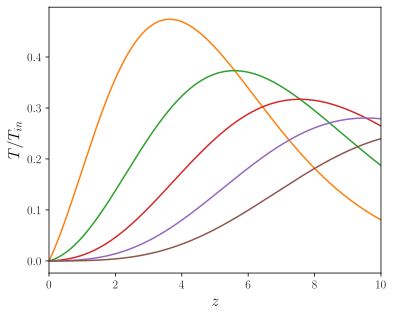

In [342]:
fig, ax = plt.subplots()
plt.plot(Z, Tss[::200,:].T*T0/(Tin - T0))

# plt.text(0.8, -0.075, r'$T_{in}/2$', fontsize=14)

plt.xlim([0, 10])

# plt.legend([r'$t = 0$ '+ r'(DNS)', r'$t = 0$ ' + r'(char.)', r'$t = {:.3f}$'.format(np.round(n00*dt*H/u/tf, 3)) + r'$\, t_f$', 
#             r'$t = 1/4 \,t_f$',
#             r'$t = 2/4 \,t_f$', r'$t = 3/4 \,t_f$', r'$t = t_f$'], bbox_to_anchor=(1, 1), loc='upper left')
ax.set_box_aspect(0.8)
ax.set_xlabel(r'$z$')
ax.set_ylabel(r'$T/T_{in}$')

# fig.savefig('DNS_vs_characteristics.pdf', bbox_inches='tight')
plt.show()